### EXPLORATORY DATA ANALYSIS ON THE GIVEN DATA SOURCES

Note: The conclusions were given with each plot

In [1]:
!pip install openpyxl

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns


In [3]:
#### Reading all the six datasets for the purpose of EDA and merging

sales_data = pd.read_csv("Data/sales_data.csv")
google_search_data=pd.read_excel("Data/google_search_data.xlsx", sheet_name="google_search_data_1111",engine='openpyxl')
social_media_data=pd.read_excel("Data/Social_Media_data_v1.xlsx", sheet_name = "Sheet1",engine='openpyxl')
pdt_man_list = pd.read_csv("Data/product_manufacturer_list.csv")
theme_list = pd.read_csv("Data/Theme_list.csv")
theme_pdt_list = pd.read_csv("Data/Theme_product_list.csv")

In [4]:
sales_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4526182 entries, 0 to 4526181
Data columns (total 5 columns):
 #   Column                 Dtype  
---  ------                 -----  
 0   system_calendar_key_N  int64  
 1   product_id             int64  
 2   sales_dollars_value    float64
 3   sales_units_value      int64  
 4   sales_lbs_value        int64  
dtypes: float64(1), int64(4)
memory usage: 172.7 MB


In [5]:
#### We have multiple themes associated with each product. Thus here we have generated a mapping from product to list 
#### of themes corresponding to each product using gropuby product_id on product to theme mapping dataframe

df1 = theme_pdt_list.groupby("PRODUCT_ID")["CLAIM_ID"].apply(list).reset_index(name="Claim_ID")

In [6]:
df1

,PRODUCT_ID,Claim_ID
0,1,[0]
1,2,[0]
2,3,[0]
3,4,[0]
4,5,[0]
...,...,...
57312,57313,[8]
57313,57314,"[40, 8]"
57314,57315,[8]
57315,57316,[8]


In [7]:
sales_data.head()
type(sales_data["system_calendar_key_N"][1])

numpy.int64

In [8]:
#### Getting Year, Month from the date. 
####This data will have more relevance to observe the seasonality rather than taking the date value as it is

def get_year(x):
    return str(x)[:4]
def get_month(x):
    return (x)[4:6]
def get_date(x):
    return pd.datetime(int(str(x)[:4]), int((x)[4:6]), int((x)[6:]))
sales_data["system_calendar_key_N"] = sales_data["system_calendar_key_N"].map(str)
sales_data["year"] = sales_data["system_calendar_key_N"].apply(lambda x: get_year(x))
sales_data["month"] = sales_data["system_calendar_key_N"].apply(lambda x: get_month(x))
sales_data["Date"] = sales_data["system_calendar_key_N"].apply(lambda x: get_date(x))

<ipython-input-8-58ba6d2ebba7>:9: FutureWarning: The pandas.datetime class is deprecated and will be removed from pandas in a future version. Import from datetime module instead.
  return pd.datetime(int(str(x)[:4]), int((x)[4:6]), int((x)[6:]))


In [9]:
#### Getting Week_No. from the date. 
sales_data["Week_No."] = sales_data["Date"].dt.week

In [10]:
print("Total number of products present in product data: ", pdt_man_list["PRODUCT_ID"].nunique())
print("Total number of products present in sales data: ", sales_data["product_id"].nunique())

Total number of products present in product data:  67175
Total number of products present in sales data:  42616


We can see from the above figures that out of 67,175 products present in the product to manufacturer mapping data, the sales data of 42,616 products was presented to us

In [ ]:
#### Assigning claim_ids to each product using mapping technique based on dataframe(df1) generated above

sales_data["claim_id"] = sales_data["product_id"].map(lambda x: ("".join(str(df1[df1["PRODUCT_ID"] == x]["Claim_ID"]).split("\n")[0].split(" ")[4:])))

In [ ]:
#### Creating a mapping between each product in sales data and its vendor using the Product to Vendor mapping data

sales_data["Vendor"] = sales_data["product_id"].map(lambda x: (" ".join(str((pdt_man_list[pdt_man_list["PRODUCT_ID"] == x])["Vendor"]).split("\n")[0].split(" ")[4:])))

In [ ]:
sales_data.to_csv("sales_data_updated.csv")

In [ ]:
#### Creating an aggregation of total posts in social media data based on Theme_ID, Year of posting and the Week of posting.
#### This aggregates can be merged with the sales data, based on the above attributes and can be used for modelling purposes.
#### It can be seen that social media data posts are one of the major drivers of sales

df2 = (pd.DataFrame(social_media_data.groupby(["Theme Id", "YEAR", "WEEK_NUM"])["total_post"]
                    .apply(list).reset_index(name="total_post")))

In [ ]:
df2

In [ ]:
#### Function for mapping the sales data to the social media aggregation data(df2) generated above using a mapping technique

def get_total_post(a, b, c):
    s = 0
    l = (list(a[1:-1].replace("..","").split(",")))
    for i in l:
        if i!="":
            l1 = (list((df2[(df2["Theme Id"] == int(i)) & (df2["WEEK_NUM"] == b) & (df2["YEAR"] == c)]["total_post"])))
            if len(l1) > 0:
                s = s + sum(l1[0])
    return s

In [ ]:
sales_data['total_media_post'] = list(map(get_total_post, sales_data['claim_id'], sales_data['Week_No.'], sales_data['year']))

In [ ]:
#Creating an aggregation of total search volume in google search data based on Claim_ID, Year of search and the Week of posting.
#### This aggregates can be merged with the sales data, based on the above attributes and can be used for modelling purposes.
#### It can be seen that google search volume is one of the major drivers of sales


df3 = (pd.DataFrame(google_search_data.groupby(["Claim_ID", "year_new", "week_number"])["searchVolume"]
                    .apply(list).reset_index(name="searchVolume")))

In [ ]:
df3

In [ ]:
#### Function for mapping the sales data to the search volume aggregation data(df2) generated above using a mapping technique
def get_search_volume(a, b, c):
    s = 0
    l = (list(a[1:-1].replace("..","").split(",")))
    for i in l:
        if i!="":
            l1 = (list((df3[(df3["Claim_ID"] == int(i)) & (df3["week_number"] == b) & (df3["year_new"] == c)]["searchVolume"])))
            if len(l1) > 0:
                s = s + sum(l1[0])
    return s

In [ ]:
sales_data['google_search_volume'] = list(map(get_search_volume, sales_data['claim_id'], sales_data['Week_No.'], sales_data['year']))

In [ ]:
sales_data["year"] = sales_data["year"].astype("int64")
sales_data["system_calendar_key_N"] = sales_data["system_calendar_key_N"].astype("int64")
sales_data["month"] = sales_data["month"].astype("int64")
sales_data.info()

In [12]:
sales_data = pd.read_csv("Data/sales_data_updated.csv")

In [14]:
sales_data.drop("Unnamed: 0",axis = 1,inplace = True)
sales_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4526182 entries, 0 to 4526181
Data columns (total 67 columns):
 #   Column                 Dtype  
---  ------                 -----  
 0   system_calendar_key_N  int64  
 1   product_id             int64  
 2   sales_dollars_value    float64
 3   sales_units_value      int64  
 4   sales_lbs_value        int64  
 5   year                   int64  
 6   month                  int64  
 7   Date                   object 
 8   claim_id               object 
 9   Vendor                 object 
 10  Week_No.               int64  
 11  total_media_post       int64  
 12  google_search_volume   int64  
 13  430                    int64  
 14  32                     int64  
 15  211                    int64  
 16  432                    int64  
 17  81                     int64  
 18  185                    int64  
 19  171                    int64  
 20  145                    int64  
 21  15                     int64  
 22  384               

In [15]:
##Function for identifying claim id for each record in google search data
l =[]
def get_claim_name(x):
    for i in theme_list["CLAIM_ID"]:
        if x == i:
            l.append((theme_list[theme_list["CLAIM_ID"] == x]["Claim Name"]).to_string().split("   ")[1].strip())
            
#### Merging google search data with the theme data based on claim ID
google_search_data["Claim_ID"].apply(get_claim_name)            
google_search_data["Claim Name"] = l

In [16]:
#### Merging social media data with the theme data based on theme ID 

l = []
social_media_data["Theme Id"].apply(get_claim_name)
social_media_data["Claim Name"] = l

In [17]:
social_media_data.head()

,Theme Id,published_date,total_post,YEAR,MONTH,WEEK_NUM,Claim Name
0,148,10-01-2015,76,2015,Jan,2,tuna
1,148,10-10-2015,31,2015,Oct,41,tuna
2,148,10-11-2015,65,2015,Nov,46,tuna
3,148,10-12-2015,88,2015,Dec,50,tuna
4,148,13-10-2015,85,2015,Oct,42,tuna


Text(0.5, 1.0, 'sales_units_value')

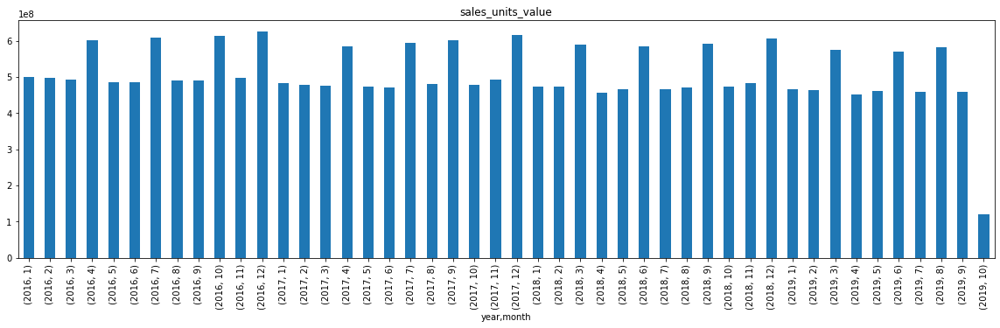

In [18]:
df = (sales_data.groupby(["year","month"])["sales_units_value"].sum())
plt.rcParams['figure.figsize'] = [20, 5]
df.plot(kind = "bar" )
plt.title("sales_units_value")

Text(0.5, 1.0, 'sales_lbs_value')

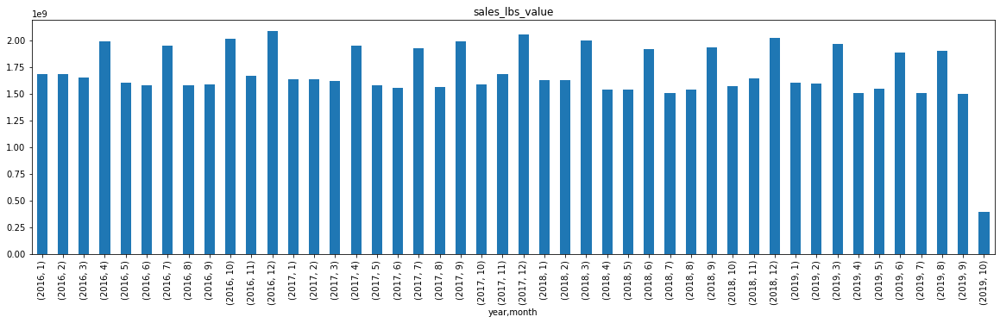

In [19]:
df1 = (sales_data.groupby(["year","month"])["sales_lbs_value"].sum())
plt.rcParams['figure.figsize'] = [20, 5]
df1.plot(kind = "bar")
plt.title("sales_lbs_value")

Text(0.5, 1.0, 'sales_dollars_value')

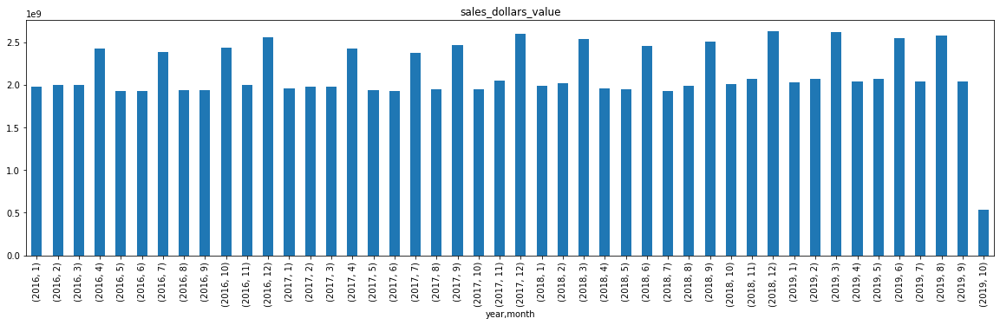

In [20]:
df2 = (sales_data.groupby(["year","month"])["sales_dollars_value"].sum())
plt.rcParams['figure.figsize'] = [20, 5]
df2.plot(kind = "bar")
plt.title("sales_dollars_value")

Text(0.5, 1.0, 'total_media_post')

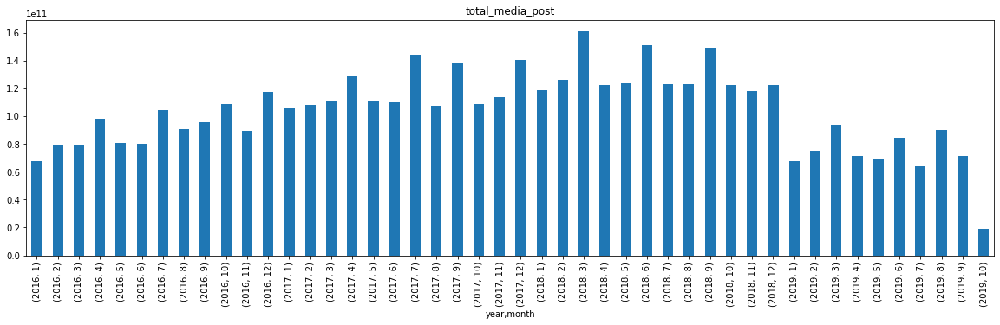

In [21]:
df3 = (sales_data.groupby(["year","month"])["total_media_post"].sum())
plt.rcParams['figure.figsize'] = [20, 5]
df3.plot(kind = "bar")
plt.title("total_media_post")

Text(0.5, 1.0, 'google_search_volume')

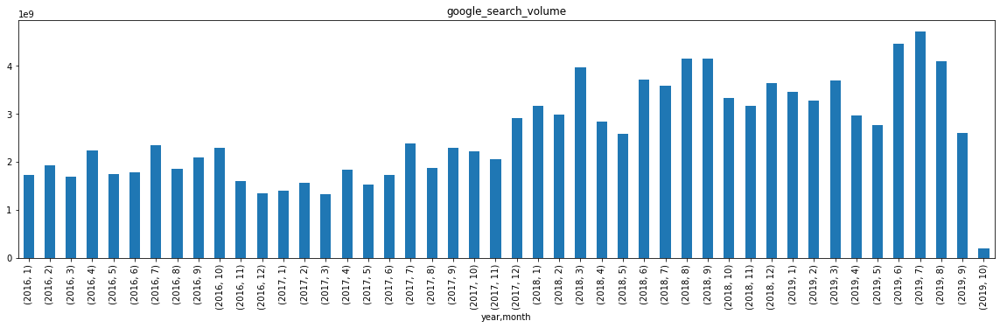

In [22]:
df4 = (sales_data.groupby(["year","month"])["google_search_volume"].sum())
plt.rcParams['figure.figsize'] = [20, 5]
df4.plot(kind = "bar")
plt.title("google_search_volume")

Though from the data generated it seems that there are outliers present in the data, based on the above plots on the sales data, it can be seen that the data actually has periodic spikes and thus it can be taken as a seasonality effect in the data rather than considering them as outliers

# List of themes available across all data sources

In [23]:
t = []
l1 = []

#### Function for identifying unique themes from each data source. Since, we have assigned a list of themes to each product
#### We consider each theme in each list corressponding to each product and form a list of unique themes
def get_unique_themes(x):
    l = (list(x[1:-1].replace(".","").split(",")))
    for i in l:
        l1.append(i)
        if (i!="") and (i not in t):
            t.append(i)

In [24]:
sales_data["claim_id"].map(lambda x: get_unique_themes(x))

0          None
1          None
2          None
3          None
4          None
           ... 
4526177    None
4526178    None
4526179    None
4526180    None
4526181    None
Name: claim_id, Length: 4526182, dtype: object

In [25]:
##### The following are the unique themes in sales data

unique_themes_in_sales = list(map(int, set(t)))
print(unique_themes_in_sales)


[385, 185, 145, 228, 187, 220, 158, 207, 171, 151, 0, 39, 192, 65, 125, 73, 186, 287, 1, 384, 101, 58, 81, 430, 147, 152, 16, 227, 38, 22, 191, 120, 222, 32, 8, 178, 15, 75, 438, 18, 432, 100, 193, 211, 2, 433, 437, 43, 224, 148, 163, 393, 142, 40]


In [26]:
#### Identifying unique themes across each data source.
#### In social media data, the records for which the claim id is not given are considered to be belonging to no claim category  

total_themes = set(list(theme_list["Claim Name"].dropna()))
themes_in_sales=set(unique_themes_in_sales)
themes_in_google=set(list(google_search_data["Claim_ID"].dropna()))
themes_in_social=set(list(social_media_data["Theme Id"].dropna()))
print("Total unique available across Sales data ",len(set(themes_in_sales)))
print(themes_in_sales)
print()
print("Total unique available across Google Search data ",len(set(themes_in_google)))
print(themes_in_google)
print()
print("Total number of themes available across social media data ",len(set(themes_in_social)))
print(themes_in_social)
print()
total_themes_in_all_datasources=set(list(themes_in_social)+list(themes_in_sales)+list(themes_in_google))
total_themes_in_all_datasources.remove(0)
print("Total number of themes available across all data sources ",len(total_themes_in_all_datasources)-1)
print()
print(total_themes_in_all_datasources)

Total unique available across Sales data  54
{0, 385, 1, 384, 2, 8, 393, 142, 15, 16, 145, 18, 147, 148, 22, 151, 152, 158, 287, 32, 163, 38, 39, 40, 171, 43, 430, 432, 433, 178, 437, 438, 185, 186, 187, 58, 191, 192, 65, 193, 73, 75, 207, 81, 211, 220, 222, 224, 227, 228, 101, 100, 120, 125}

Total unique available across Google Search data  160
{514, 516, 519, 8, 526, 531, 536, 541, 543, 39, 40, 555, 556, 558, 566, 567, 574, 576, 65, 583, 587, 75, 79, 81, 594, 600, 601, 605, 606, 608, 100, 613, 101, 615, 616, 618, 620, 622, 632, 120, 634, 125, 650, 138, 139, 142, 657, 659, 148, 151, 152, 668, 158, 670, 163, 677, 681, 682, 683, 684, 173, 177, 689, 187, 702, 191, 192, 704, 193, 707, 197, 713, 716, 207, 720, 211, 732, 737, 738, 227, 228, 741, 743, 747, 754, 755, 761, 770, 777, 780, 782, 785, 788, 789, 799, 803, 813, 816, 821, 823, 832, 839, 842, 843, 844, 847, 852, 860, 867, 869, 870, 877, 884, 887, 889, 384, 900, 901, 903, 904, 393, 906, 907, 908, 913, 915, 916, 918, 922, 928, 929, 930

# Consumer preference(themes) available in each data source

CONSUMER PREFERENCE IN SALES_DATA

In [27]:
#### For identifying the consumer preference in the sales data, we have created a dictionary with theme ids as keys and the
#### aggregate sales as values. The dictionary obtained after iterating over theme id lists for each product in sales data, 
#### is sorted in the descending order for identifying the high preferred themed


uts = list(unique_themes_in_sales) #### uts - unique themes in sales data
themes_dict = {uts[i]: 0 for i in range(0, len(uts))}

In [33]:
def get_total_sales_theme_wise(a, b):
    s = 0
    l = (list(a[1:-1].replace("..","").split(",")))
    for i in l:
        if i!="":
            themes_dict[int(i)] = themes_dict[int(i)] + b
    return s

In [34]:
l = list(map(get_total_sales_theme_wise, sales_data["claim_id"], sales_data["sales_dollars_value"]))
ordered_dict = {k: v for k, v in sorted(themes_dict.items(), key=lambda item: item[1], reverse = True)}

Ordered_dict gives us the sales value for each theme in descending order and it helps us in understanding the more preferred themes

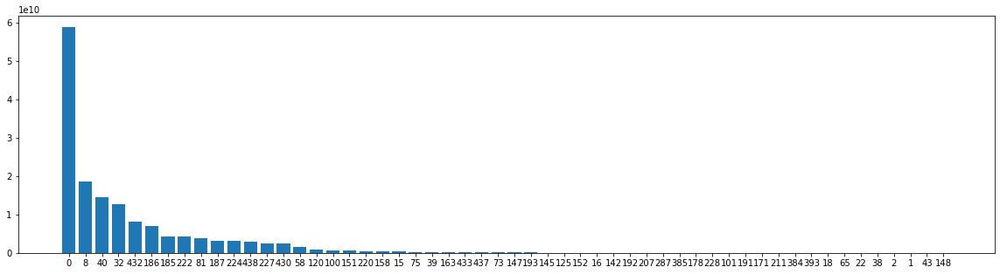

In [35]:
names = list(ordered_dict.keys())
values = list(ordered_dict.values())
plt.bar(range(len(ordered_dict)), values, tick_label=names)
plt.show()

Top 5 preferenced theme_ids in sales data other than no-claim category

1. 8
2. 40
3. 32
4. 432
5. 186

CONSUMER PREFERENCE IN GOOGLE_SEARCH_DATA

In [36]:
google_search_data.head()

,date,platform,searchVolume,Claim_ID,week_number,year_new,MONTH,Claim Name
0,2014-01-05,google,349,916,1,2014,Jan,gluten free
1,2014-01-06,google,349,916,2,2014,Jan,gluten free
2,2014-01-07,google,697,916,2,2014,Jan,gluten free
3,2014-01-10,google,349,916,2,2014,Jan,gluten free
4,2014-01-20,google,697,916,4,2014,Jan,gluten free


In [37]:
#### We have aggregated total search volume in the google search data based on Claim ID using groupby technique

gdf = google_search_data.groupby("Claim Name")["searchVolume"].sum().sort_values(ascending = False)

Text(0.5, 1.0, 'Theme Preference in Google Search Data')

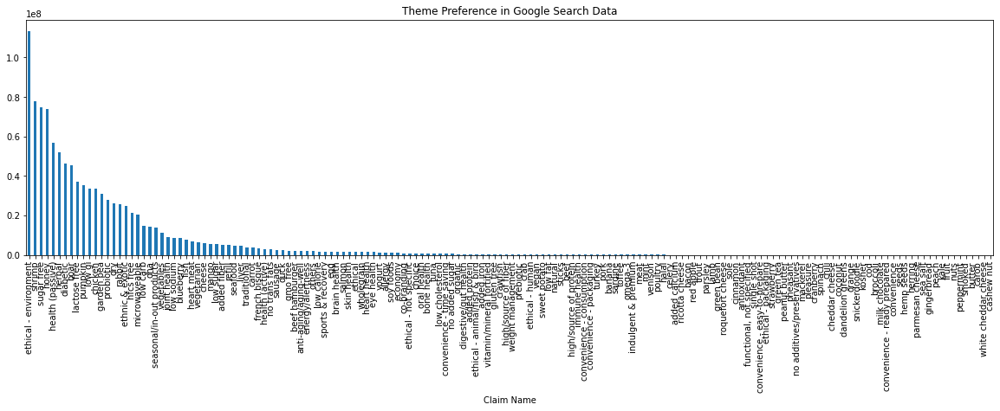

In [38]:
gdf.plot(kind = "bar")
plt.title("Theme Preference in Google Search Data")

In [39]:
df = (google_search_data.groupby(["platform","Claim Name"])["searchVolume"].sum())
df

platform  Claim Name   
amazon    added calcium       113
          added fiber      182727
          added iron         1793
          added protein      1240
          allergy            2831
                            ...  
walmart   toffee               74
          traditional       33990
          vegetables         1563
          vegetarian           33
          yogurt              481
Name: searchVolume, Length: 402, dtype: int64

In [40]:
df["amazon"] = df["amazon"].sort_values(ascending = False)
df["chewy"] = df["chewy"].sort_values(ascending = False)
df["google"] = df["google"].sort_values(ascending = False)
df["walmart"] = df["walmart"].sort_values(ascending = False)

In [41]:
plt.rcParams['figure.figsize'] = [20, 5]

Text(0.5, 1.0, 'Theme Preference in Amazon Platform in Google Search Data')

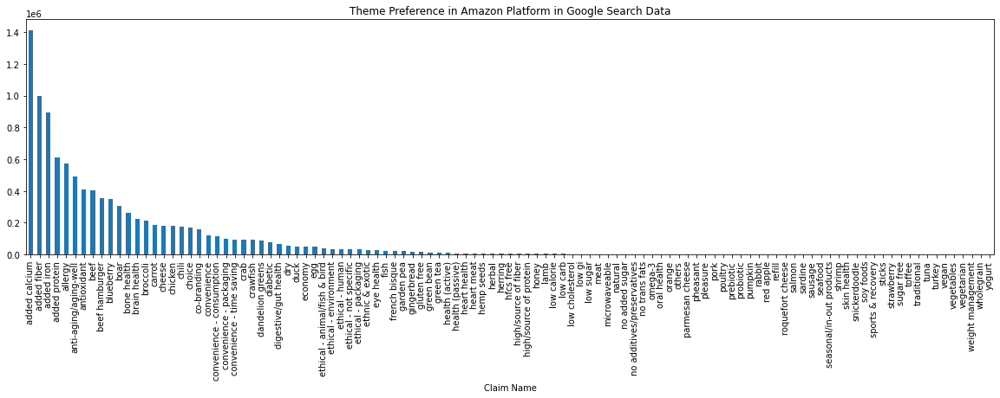

In [42]:
df["amazon"].plot(kind = "bar")
plt.title("Theme Preference in Amazon Platform in Google Search Data")

Text(0.5, 1.0, 'Theme Preference in Chewy Platform in Google Search Data')

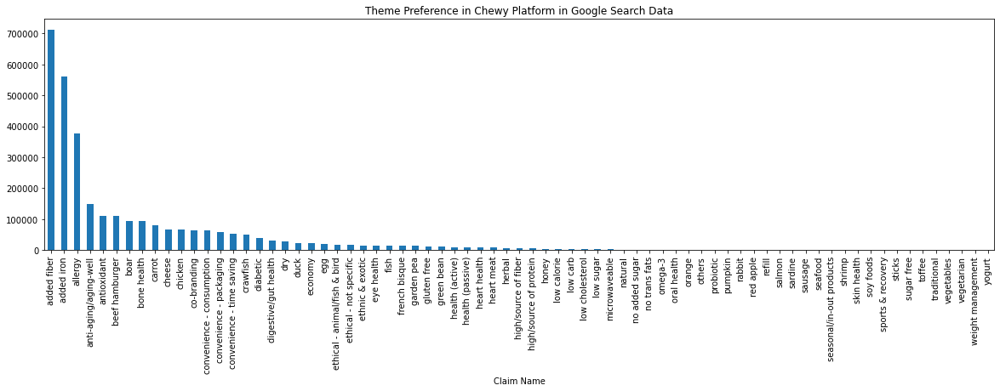

In [43]:
df["chewy"].plot(kind = "bar")
plt.title("Theme Preference in Chewy Platform in Google Search Data")

Text(0.5, 1.0, 'Theme Preference in Google Platform in Google Search Data')

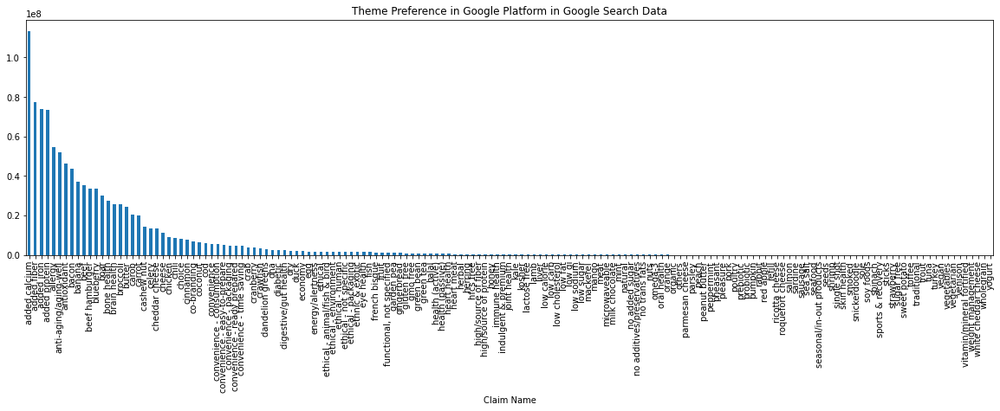

In [44]:
df["google"].plot(kind = "bar")
plt.title("Theme Preference in Google Platform in Google Search Data")

Text(0.5, 1.0, 'Theme Preference in Walmart Platform in Google Search Data')

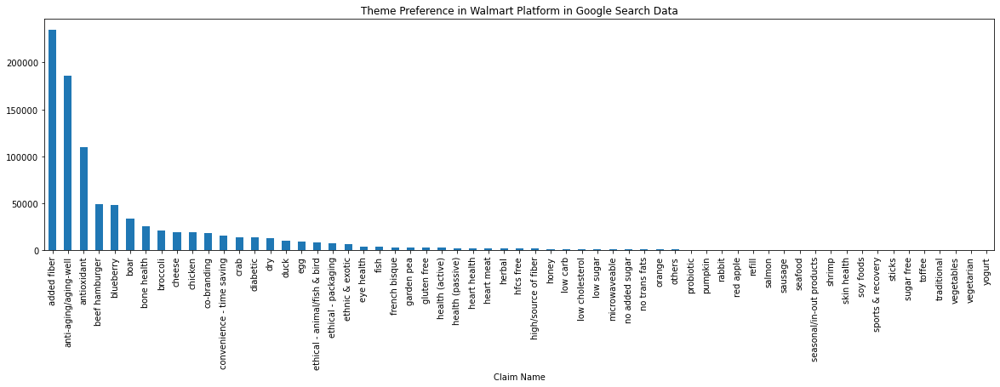

In [45]:
df["walmart"].plot(kind = "bar")
plt.title("Theme Preference in Walmart Platform in Google Search Data")

Based on the above plots we can understand the consumer preferences in the overall google search data as well as consumer preferences from each platform say amazon, chewy, walmart

Top 5 preferences in overall google search data

1. Ethical Environment
2. Shrimp
3. Sugar Free
4. Health(Passive)
5. Herbal

Top 5 preferences in Chewy Platform

1. Added fiber
2. Added iron
3. Allergy
4. Anti-aging/aging well
5. Antioxidant

Top 5 preferences in Amazon Platform

1. Added calcium
2. Added Fiber
3. Added iron
4. Added protein
5. Allergy

Top 5 preferences in Google Platform

1. Added calcium
2. Added Fiber
3. Added iron
4. Added protein
5. Allergy

Top 5 preferences in Walmart Platform

1. Added Fiber
2. Anti-aging/Aging-well
3. Antioxidant
4. Beef Hamburger
5. Blueberry

CONSUMER PREFERENCE IN SOCIAL_MEDIA_DATA

In [46]:
social_media_data_modified = social_media_data[social_media_data["Theme Id"] != 0]

In [47]:
social_media_data_modified

,Theme Id,published_date,total_post,YEAR,MONTH,WEEK_NUM,Claim Name
0,148,10-01-2015,76,2015,Jan,2,tuna
1,148,10-10-2015,31,2015,Oct,41,tuna
2,148,10-11-2015,65,2015,Nov,46,tuna
3,148,10-12-2015,88,2015,Dec,50,tuna
4,148,13-10-2015,85,2015,Oct,42,tuna
...,...,...,...,...,...,...,...
533385,876,09-05-2019,4658,2019,May,19,caramel
533386,876,09-06-2019,3731,2019,Jun,24,caramel
533387,876,09-07-2019,2336,2019,Jul,28,caramel
533388,876,09-08-2019,1374,2019,Aug,32,caramel


<AxesSubplot:xlabel='Claim Name'>

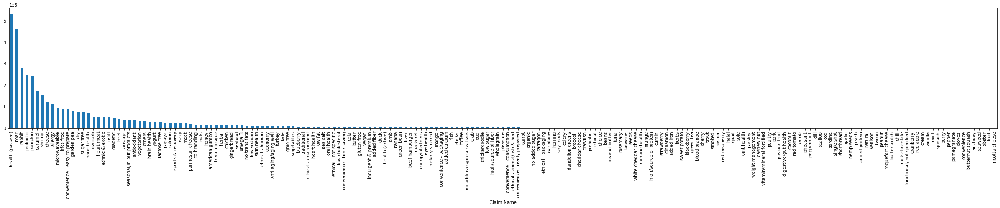

In [48]:
plt.rcParams['figure.figsize'] = [40, 5]
social_media_data_modified.groupby("Claim Name")["total_post"].sum().sort_values(ascending = False).plot(kind = "bar")

Based on the above plot we can understand the consumer preferences from the social media data

Top 5 preferences in social media data

1. Health(Passive)
2. Boar
3. Rabbit
4. Probiotic
5. Pumpkin

# Analysis Based on Time Granularity on each data source

## For Google Search Data

In [49]:
google_search_data.head()

,date,platform,searchVolume,Claim_ID,week_number,year_new,MONTH,Claim Name
0,2014-01-05,google,349,916,1,2014,Jan,gluten free
1,2014-01-06,google,349,916,2,2014,Jan,gluten free
2,2014-01-07,google,697,916,2,2014,Jan,gluten free
3,2014-01-10,google,349,916,2,2014,Jan,gluten free
4,2014-01-20,google,697,916,4,2014,Jan,gluten free


In [50]:
len(google_search_data["Claim Name"].unique())

160

Yearly Analysis

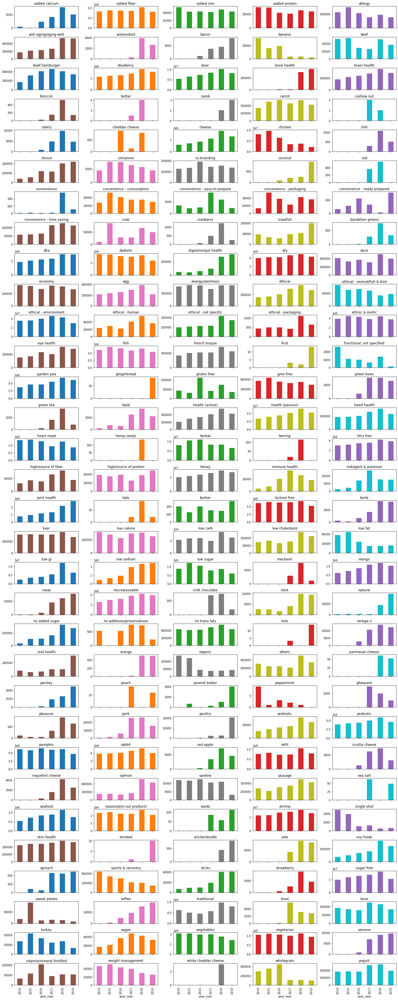

In [64]:
plt.rcParams['figure.figsize'] = [20, 50]
r1=google_search_data.groupby(["year_new","Claim Name"])["searchVolume"].sum().unstack(level=1)
r1.plot(kind = 'bar',subplots=True,layout = (32,5),legend = None)
plt.tight_layout()

Weekly Analysis

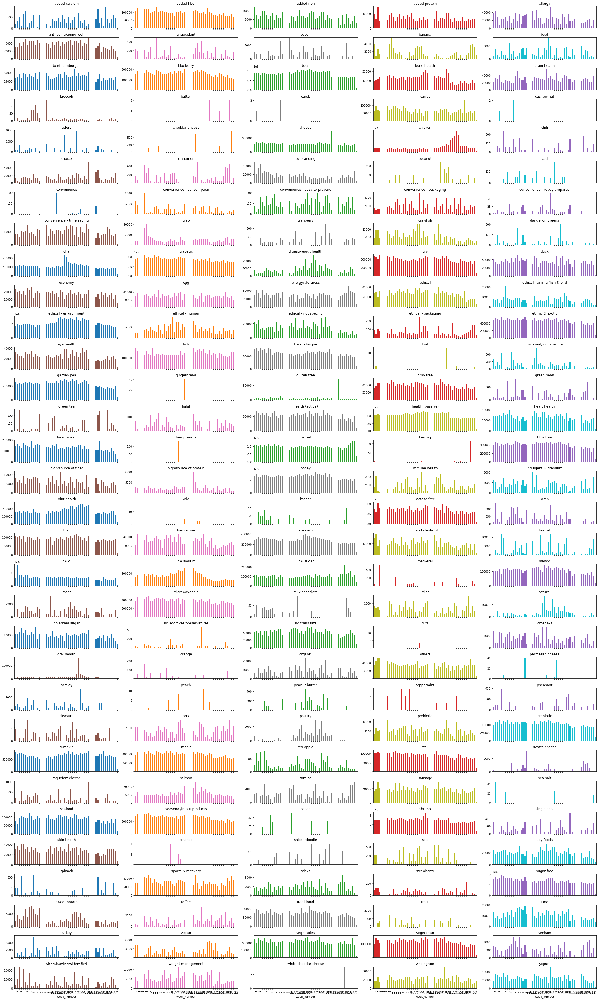

In [65]:
plt.rcParams['figure.figsize'] = [30, 50]
r1=google_search_data.groupby(["week_number","Claim Name"])["searchVolume"].sum().unstack(level=1)
r1.plot(kind = 'bar',subplots=True,layout = (32,5),legend = None)
plt.tight_layout()

Monthly Analysis

In [66]:
type(google_search_data["date"][1])

pandas._libs.tslibs.timestamps.Timestamp

In [67]:
google_search_data.head()

,date,platform,searchVolume,Claim_ID,week_number,year_new,MONTH,Claim Name,month
0,2014-01-05,google,349,916,1,2014,Jan,gluten free,1
1,2014-01-06,google,349,916,2,2014,Jan,gluten free,1
2,2014-01-07,google,697,916,2,2014,Jan,gluten free,1
3,2014-01-10,google,349,916,2,2014,Jan,gluten free,1
4,2014-01-20,google,697,916,4,2014,Jan,gluten free,1


In [68]:
google_search_data['month']=pd.to_datetime(google_search_data["date"],format="%d-%m-%Y").dt.month

In [69]:
google_search_data.head()

,date,platform,searchVolume,Claim_ID,week_number,year_new,MONTH,Claim Name,month
0,2014-01-05,google,349,916,1,2014,Jan,gluten free,1
1,2014-01-06,google,349,916,2,2014,Jan,gluten free,1
2,2014-01-07,google,697,916,2,2014,Jan,gluten free,1
3,2014-01-10,google,349,916,2,2014,Jan,gluten free,1
4,2014-01-20,google,697,916,4,2014,Jan,gluten free,1


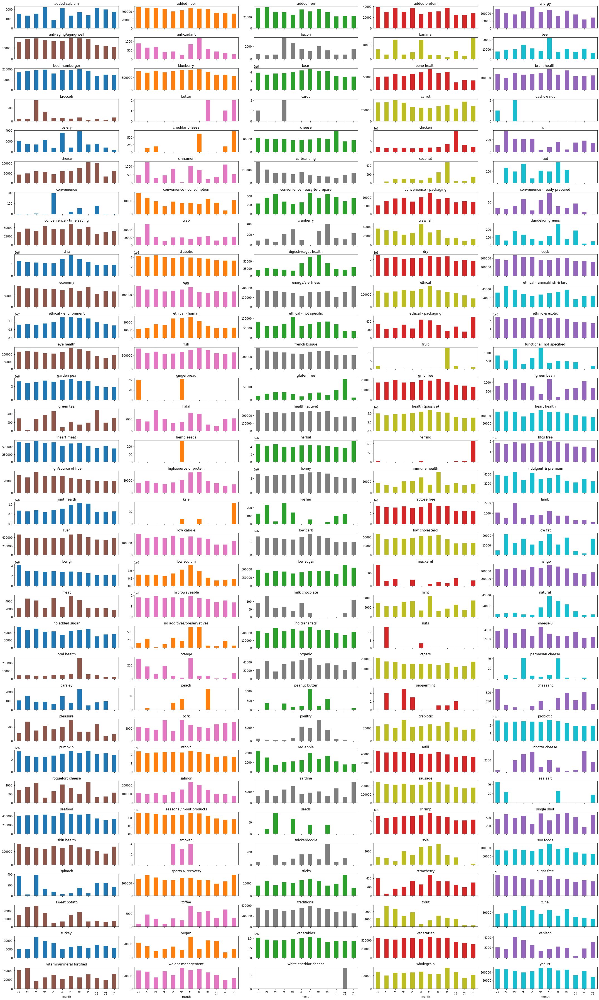

In [71]:
plt.rcParams['figure.figsize'] = [30, 50]
r1=google_search_data.groupby(["month","Claim Name"])["searchVolume"].sum().unstack(level=1)
r1.plot(kind = 'bar',subplots=True,layout = (32,5),legend = None)
plt.tight_layout()

## For Social Media Data

In [72]:
social_media_data.head()
social_media_data["published_date"]=pd.to_datetime(social_media_data["published_date"])

In [73]:
social_media_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 533390 entries, 0 to 533389
Data columns (total 7 columns):
 #   Column          Non-Null Count   Dtype         
---  ------          --------------   -----         
 0   Theme Id        533390 non-null  int64         
 1   published_date  533390 non-null  datetime64[ns]
 2   total_post      533390 non-null  int64         
 3   YEAR            533390 non-null  int64         
 4   MONTH           533390 non-null  object        
 5   WEEK_NUM        533390 non-null  int64         
 6   Claim Name      533390 non-null  object        
dtypes: datetime64[ns](1), int64(4), object(2)
memory usage: 28.5+ MB


In [74]:
social_media_data["published_date"]=social_media_data["published_date"].dt.strftime('%m/%d/%Y')

In [75]:
social_media_data.head(10)

,Theme Id,published_date,total_post,YEAR,MONTH,WEEK_NUM,Claim Name
0,148,10/01/2015,76,2015,Jan,2,tuna
1,148,10/10/2015,31,2015,Oct,41,tuna
2,148,10/11/2015,65,2015,Nov,46,tuna
3,148,10/12/2015,88,2015,Dec,50,tuna
4,148,10/13/2015,85,2015,Oct,42,tuna
5,148,10/14/2015,27,2015,Oct,42,tuna
6,148,10/15/2015,20,2015,Oct,42,tuna
7,148,10/16/2015,10,2015,Oct,42,tuna
8,148,10/17/2015,12,2015,Oct,42,tuna
9,148,10/18/2015,2,2015,Oct,43,tuna


In [76]:
social_media_data['year'] = pd.DatetimeIndex(social_media_data['published_date']).year
social_media_data['month'] = pd.DatetimeIndex(social_media_data['published_date']).month

In [77]:
plt.rcParams['figure.figsize'] = [25,100]

C:\Users\mahathi.paidimar\Miniconda3\envs\case_study-dev\lib\site-packages\pandas\plotting\_matplotlib\tools.py:331: MatplotlibDeprecationWarning: 
The is_first_col function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use ax.get_subplotspec().is_first_col() instead.
  if ax.is_first_col():


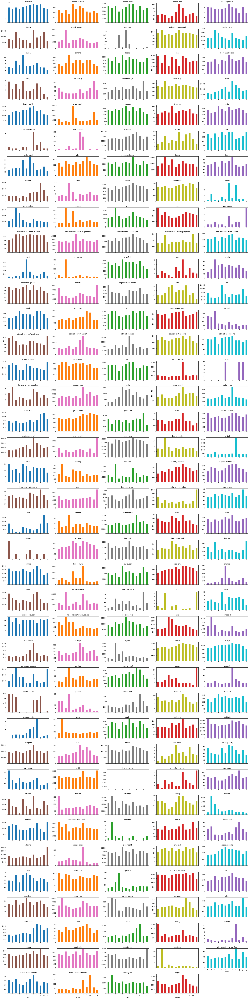

In [78]:
r1=social_media_data.groupby(["month","Claim Name"])["total_post"].sum().unstack(level=1)
r1.plot(kind = 'bar',subplots=True,layout = (39,5),legend = None)
plt.tight_layout()

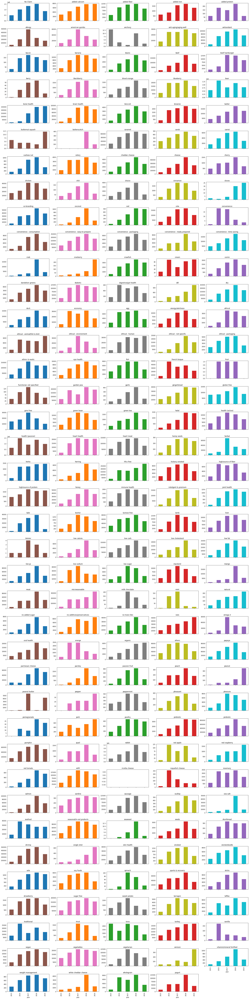

In [79]:
r1=social_media_data.groupby(["year","Claim Name"])["total_post"].sum().unstack(level=1)
r1.plot(kind = 'bar',subplots=True,layout = (39,5),legend = None)
#plt.rcParams['figure.figsize'] = [25, 30]
plt.tight_layout()

In [80]:

social_media_data["published_date"]=pd.to_datetime(social_media_data["published_date"])
social_media_data["week"] = social_media_data["published_date"].dt.week
social_media_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 533390 entries, 0 to 533389
Data columns (total 10 columns):
 #   Column          Non-Null Count   Dtype         
---  ------          --------------   -----         
 0   Theme Id        533390 non-null  int64         
 1   published_date  533390 non-null  datetime64[ns]
 2   total_post      533390 non-null  int64         
 3   YEAR            533390 non-null  int64         
 4   MONTH           533390 non-null  object        
 5   WEEK_NUM        533390 non-null  int64         
 6   Claim Name      533390 non-null  object        
 7   year            533390 non-null  int64         
 8   month           533390 non-null  int64         
 9   week            533390 non-null  int64         
dtypes: datetime64[ns](1), int64(7), object(2)
memory usage: 40.7+ MB


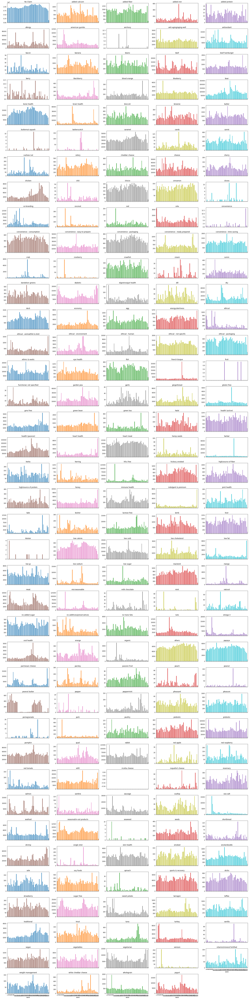

In [81]:
r1=social_media_data.groupby(["week","Claim Name"])["total_post"].sum().unstack(level=1)
r1.plot(kind = 'bar',subplots=True,layout = (39,5),legend = None)
#plt.rcParams['figure.figsize'] = [25, 30]
plt.tight_layout()

From all the above plots and analysis we can conclude that the monthly granularity or quarterly granularity is an appropriate time periodicity that can be chosen for evaluation

# Understand the overall market share of our client

In [82]:
df= sales_data.groupby("Vendor").sales_dollars_value.sum()

In [83]:
df

Vendor
A                3.093204e+10
B                1.538074e+10
D                1.196683e+10
E                1.939263e+09
F                4.995877e+09
G                1.951155e+09
H                2.277657e+09
Others           1.854419e+10
Private Label    9.753070e+09
Name: sales_dollars_value, dtype: float64

In [84]:
share_A=(df["A"]/sum(df))*100
share_A

31.64700563323608

In [85]:
labels=['A','B','D','E','F','G','H','Others','Private']

overall market share


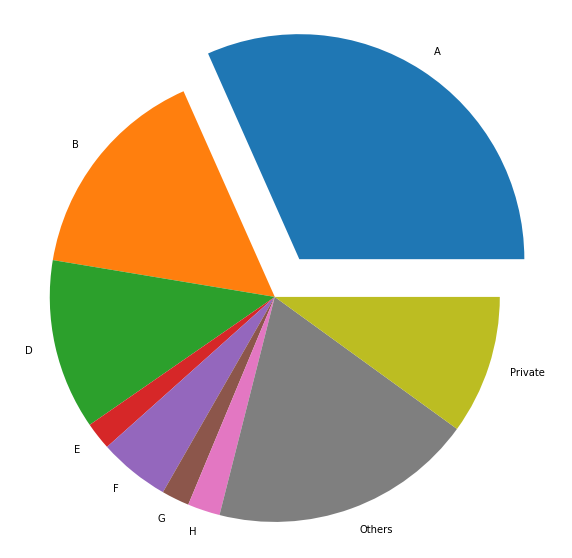

In [87]:
myexplode = [0.2, 0, 0, 0,0,0,0,0,0]
plt.rcParams['figure.figsize'] = [10,10]
plt.pie(df, labels=labels,explode=myexplode)
plt.axis('equal')
print("overall market share")
plt.show()

The above pie plot gives us the overall market share of our client which is 31.64% of the total share

In [88]:
type(df)

pandas.core.series.Series

In [89]:
labels=['A','B','D','E','F','G','H','Others','Private Label']

In [90]:
themes_dict_vendor_wise = {uts[i]: {labels[j] : 0 for j in range(0,len(labels))} for i in range(0, len(uts))}

In [91]:
def get_total_sales_vendor_wise(a, b, c):
    s = 0
    l = (list(a[1:-1].replace("..","").split(",")))
    for i in l:
        if i!="":
            themes_dict_vendor_wise[int(i)][c] = themes_dict_vendor_wise[int(i)][c] + b
    return s

In [92]:
l = list(map(get_total_sales_vendor_wise, sales_data["claim_id"], sales_data["sales_dollars_value"], sales_data["Vendor"]))

In [93]:
themes_dict_vendor_wise

{385: {'A': 0,
  'B': 0,
  'D': 0,
  'E': 0,
  'F': 0,
  'G': 0,
  'H': 0,
  'Others': 8108027.0,
  'Private Label': 0},
 185: {'A': 788451231.0,
  'B': 2060746451.0,
  'D': 725141306.0,
  'E': 0,
  'F': 11927795.0,
  'G': 0,
  'H': 52513129.0,
  'Others': 401715504.0,
  'Private Label': 208441374.0},
 145: {'A': 0,
  'B': 0,
  'D': 0,
  'E': 0,
  'F': 0,
  'G': 0,
  'H': 0,
  'Others': 49007009.0,
  'Private Label': 0},
 228: {'A': 135103.0,
  'B': 0,
  'D': 0,
  'E': 0,
  'F': 0,
  'G': 0,
  'H': 0,
  'Others': 5190089.0,
  'Private Label': 0},
 187: {'A': 454385505.0,
  'B': 3341294.0,
  'D': 7293150.0,
  'E': 0,
  'F': 76387969.0,
  'G': 0,
  'H': 390708.0,
  'Others': 2292707393.0,
  'Private Label': 293842534.0},
 220: {'A': 175576054.0,
  'B': 0,
  'D': 0,
  'E': 0,
  'F': 135532.0,
  'G': 0,
  'H': 390708.0,
  'Others': 202027658.0,
  'Private Label': 0},
 158: {'A': 40018523.0,
  'B': 3733725.0,
  'D': 17722795.0,
  'E': 0,
  'F': 13691360.0,
  'G': 0,
  'H': 1288730.0,
  'Oth

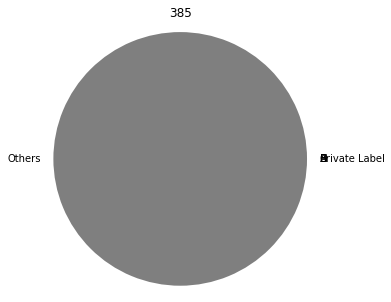

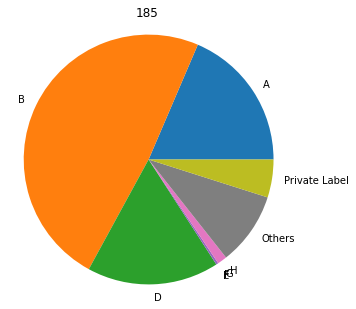

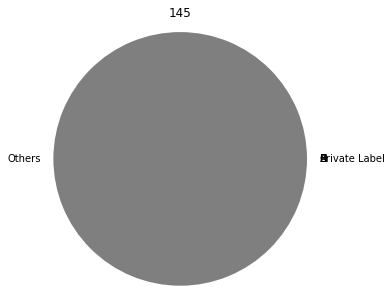

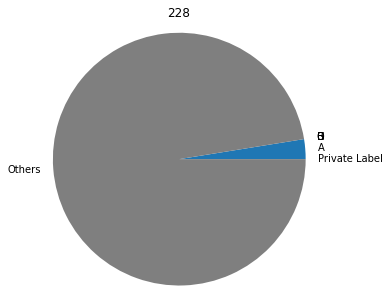

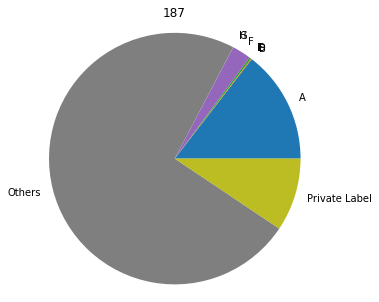

...

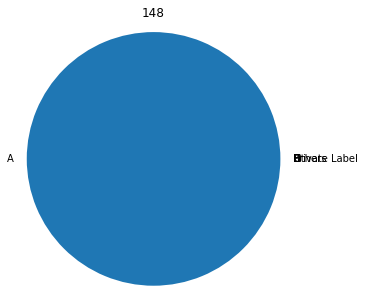

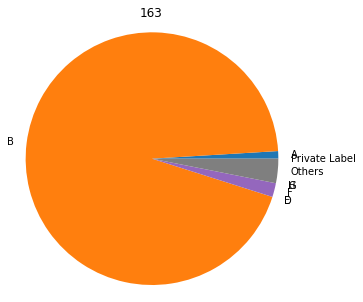

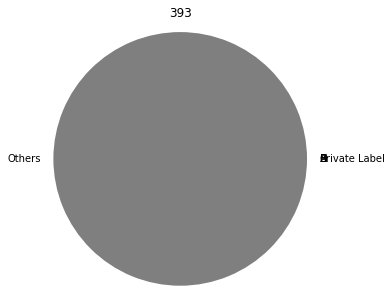

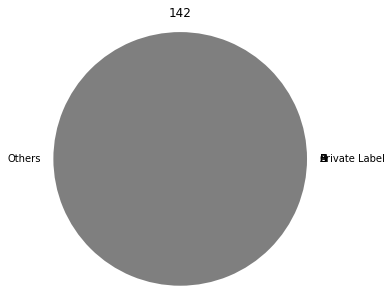

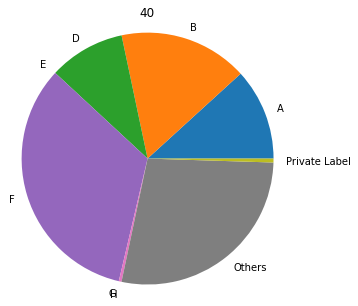

In [96]:
for i in uts:
    labels = []
    sizes = []
    diction = themes_dict_vendor_wise[i]
    for x, y in diction.items():
        labels.append(x)
        sizes.append(y)
    plt.rcParams['figure.figsize'] = [5,5]
    plt.pie(sizes, labels=labels)
    plt.axis('equal')
    plt.title(i)
    plt.show()


The themes_dict_vendor_wise gives us the share of vendor in each theme. Based on this and from the above pie plots we can identify the potential competitors for our client in each theme

# Emerging Trends in various data sources

EMERGING TRENDS IN GOOGLE SEARCH DATA

C:\Users\mahathi.paidimar\Miniconda3\envs\case_study-dev\lib\site-packages\pandas\plotting\_matplotlib\core.py:320: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


<Figure size 360x144 with 0 Axes>

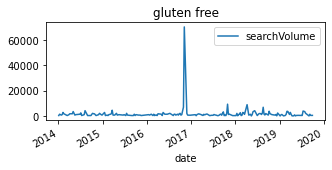

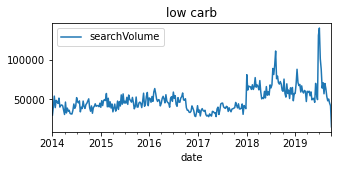

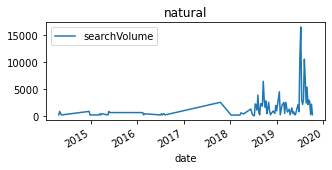

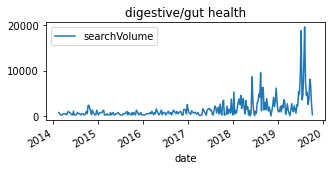

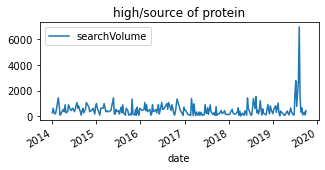

...

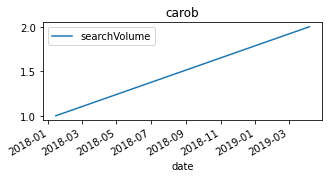

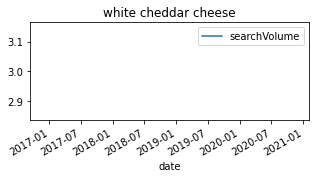

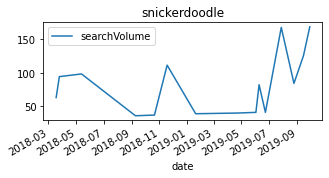

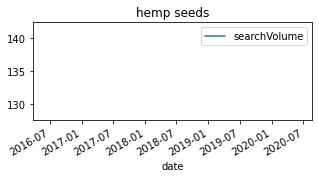

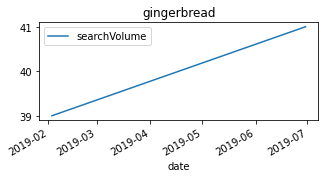

In [97]:
#### EMERGING TRENDS IN GOOGLE SEARCH DATA

df_grouped = google_search_data.groupby(by=[pd.Grouper(key="date", freq="1W"), "Claim Name"])["searchVolume"]
df_grouped = df_grouped.sum().reset_index()
categories = google_search_data["Claim Name"].unique().tolist()
plt.rcParams['figure.figsize'] = [5, 2]
plt.tight_layout()
for category in categories:
    df_category = df_grouped.loc[df_grouped["Claim Name"] == category].copy()
    df_category.plot(
        x="date", 
        y=["searchVolume"], 
        kind = "line",
        title=f"{category}")

EMERGING TRENDS IN SOCIAL MEDIA DATA

C:\Users\mahathi.paidimar\Miniconda3\envs\case_study-dev\lib\site-packages\pandas\plotting\_matplotlib\core.py:320: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


<Figure size 360x144 with 0 Axes>

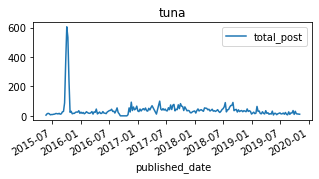

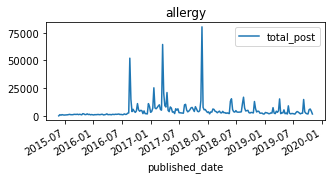

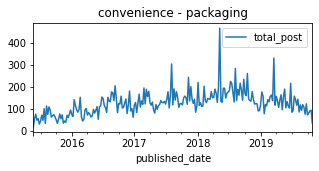

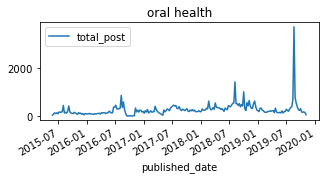

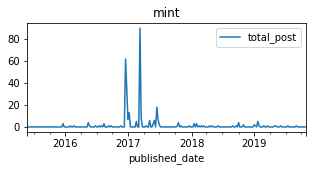

...

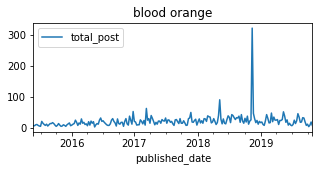

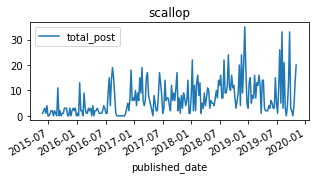

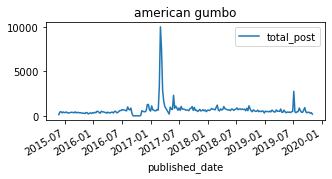

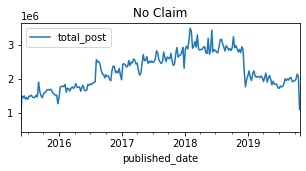

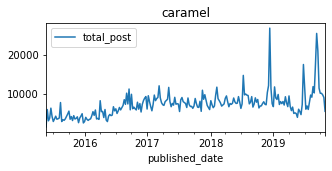

In [98]:
##EMERGING TRENDS IN SOCIAL MEDIA DATA
social_media_data["published_date"] = pd.to_datetime(social_media_data["published_date"],format = "%d-%m-%Y")
df_grouped = social_media_data.groupby(by=[pd.Grouper(key="published_date", freq="1W"), "Claim Name"])["total_post"]
df_grouped = df_grouped.sum().reset_index()
categories = social_media_data["Claim Name"].unique().tolist()
plt.rcParams['figure.figsize'] = [5, 2]
plt.tight_layout()
for category in categories:
    df_category = df_grouped.loc[df_grouped["Claim Name"] == category].copy()
    df_category.plot(
        x="published_date", 
        y=["total_post"], 
        kind = "line",
        title=f"{category}")

We can identify few emerging trends from the above plots

Emerging themes in Google Search Data
1. Herring
2. Nuts
3. Fruit
4. Butter, etc are few of the emerging trends in google search data

Emerging themes in Social Media Data
1. Low Calorie
2. Bone Health
3. Caramel, etc are few of the emerging trends in google search data


# Build the sales model and identify the driver of sales 

In [99]:
sales_data.head()

,system_calendar_key_N,product_id,sales_dollars_value,sales_units_value,sales_lbs_value,year,month,Date,claim_id,Vendor,...,120,158,186,228,142,224,178,75,65,207
0,20160109,1,13927.0,934,18680,2016,1,2016-01-09,[0],Others,...,0,0,0,0,0,0,0,0,0,0
1,20160109,3,10289.0,1592,28646,2016,1,2016-01-09,[0],Others,...,0,0,0,0,0,0,0,0,0,0
2,20160109,4,357.0,22,440,2016,1,2016-01-09,[0],Others,...,0,0,0,0,0,0,0,0,0,0
3,20160109,6,23113.0,2027,81088,2016,1,2016-01-09,[0],Others,...,0,0,0,0,0,0,0,0,0,0
4,20160109,7,23177.0,3231,58164,2016,1,2016-01-09,[0],Others,...,0,0,0,0,0,0,0,0,0,0


In [100]:
sales_data.drop('Date',inplace=True,axis=1)

In [101]:
sales_data.head()

,system_calendar_key_N,product_id,sales_dollars_value,sales_units_value,sales_lbs_value,year,month,claim_id,Vendor,Week_No.,...,120,158,186,228,142,224,178,75,65,207
0,20160109,1,13927.0,934,18680,2016,1,[0],Others,1,...,0,0,0,0,0,0,0,0,0,0
1,20160109,3,10289.0,1592,28646,2016,1,[0],Others,1,...,0,0,0,0,0,0,0,0,0,0
2,20160109,4,357.0,22,440,2016,1,[0],Others,1,...,0,0,0,0,0,0,0,0,0,0
3,20160109,6,23113.0,2027,81088,2016,1,[0],Others,1,...,0,0,0,0,0,0,0,0,0,0
4,20160109,7,23177.0,3231,58164,2016,1,[0],Others,1,...,0,0,0,0,0,0,0,0,0,0


In [102]:
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn import preprocessing, svm
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression



In [104]:
df = pd.get_dummies(sales_data, columns=['Vendor'])
df.head()

,system_calendar_key_N,product_id,sales_dollars_value,sales_units_value,sales_lbs_value,year,month,claim_id,Week_No.,total_media_post,...,207,Vendor_A,Vendor_B,Vendor_D,Vendor_E,Vendor_F,Vendor_G,Vendor_H,Vendor_Others,Vendor_Private Label
0,20160109,1,13927.0,934,18680,2016,1,[0],1,454100,...,0,0,0,0,0,0,0,0,1,0
1,20160109,3,10289.0,1592,28646,2016,1,[0],1,454100,...,0,0,0,0,0,0,0,0,1,0
2,20160109,4,357.0,22,440,2016,1,[0],1,454100,...,0,0,0,0,0,0,0,0,1,0
3,20160109,6,23113.0,2027,81088,2016,1,[0],1,454100,...,0,0,0,0,0,0,0,0,1,0
4,20160109,7,23177.0,3231,58164,2016,1,[0],1,454100,...,0,0,0,0,0,0,0,0,1,0


In [108]:
X = df.drop(['sales_dollars_value',"claim_id","system_calendar_key_N","product_id"],axis=1)
y = df['sales_dollars_value']
X

,sales_units_value,sales_lbs_value,year,month,Week_No.,total_media_post,google_search_volume,430,32,211,...,207,Vendor_A,Vendor_B,Vendor_D,Vendor_E,Vendor_F,Vendor_G,Vendor_H,Vendor_Others,Vendor_Private Label
0,934,18680,2016,1,1,454100,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
1,1592,28646,2016,1,1,454100,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
2,22,440,2016,1,1,454100,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
3,2027,81088,2016,1,1,454100,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
4,3231,58164,2016,1,1,454100,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4526177,2,3,2018,10,43,2956691,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
4526178,39,68,2018,10,43,2956691,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
4526179,59,48,2018,10,43,3684,61941,0,0,0,...,0,0,0,0,0,0,0,0,0,1
4526180,1246,4361,2018,10,43,2956691,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1


In [109]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2)
from sklearn import linear_model  
# Splitting the data into training and testing data
regr = linear_model.LinearRegression()
regr.fit(X, y)

LinearRegression()

In [110]:
print(regr.score(X_test, y_test))

0.7601072754095906


This notebook consisted of all the exploratory analysis carried out on the given data sources.

- The modelling on the data is also done using R using the techniques of 
    - Multiple Linear Regression, 
    - Ridge Regression, 
    - Lasso Regression,
    - Elastic net regression and 
    - the regression tree
- The evaluation metrics used are Root Mean Squared Error(RMSE), R-Squared, Adjusted R-Squared and the results obtained are presented in the deck prepared.

We have also customized the regression code template for the further analysis. The feature interaction reports generated by the code template are present in the code template folder.